In [ ]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn

from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import *

from sklearn import svm
from sklearn import linear_model
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import *

from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import SGDClassifier

from sklearn.neighbors import KNeighborsClassifier

import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff

## Preparing the Dataset

1. Reading from *csv*

In [2]:
training_data = pd.read_csv('./train.csv')
test_data = pd.read_csv('./test to participants.csv')

X = training_data.copy()
X_test = test_data.copy()

2. Getting the columns of the dataset and the faulty columns with missing values

In [3]:
column_names = list(training_data.columns)

In [4]:
faulty_col = training_data.isna().sum()
faulty_col_test = test_data.isna().sum()

In [5]:
missing_column_info = []

for i in range(len(faulty_col)):
    if (faulty_col[i] != 0):
        missing_column_info.append([column_names[i], training_data[column_names[i]][0], training_data[column_names[i]][100]])

pd.DataFrame(missing_column_info)

,0,1,2
0,TypeofDisability,None,None
1,Religion,NaN,Islam
2,Result,Pass,Fail
3,Grade,NaN,Grade D
4,Certificate GenerateDate,23:57.0,NaN
5,Unnamed: 16,NaN,NaN


3. Filling the missing values

In [6]:
for column_name in missing_column_info:
    X[column_name[0]].fillna('missing', inplace=True)
    X_test[column_name[0]].fillna('missing', inplace=True)

4. Dropping column with same value

In [7]:
X = X.drop(column_names[16], axis=1)
X_test = X_test.drop(column_names[16], axis=1)

5. Getting the categorical columns

In [8]:
categorical_columns = []
for name in list(X.columns):
  val = np.random.randint(1000)

  if (type(X[name][val]) == str):
    categorical_columns.append(name)

pd.DataFrame(categorical_columns)

,0
0,Gender
1,TypeofDisability
2,castecategory
3,Religion
4,JobRole
5,SectorName
6,PartnerName
7,TC State
8,TC District
9,TC Name


In [9]:
x_train = X.drop('placed', axis=1)
y_train = X['placed']

x_test = X_test.drop('placed', axis=1)
y_test = X_test['placed']

In [10]:
x_test = x_test.drop('ID', axis=1)

**One-Hot encoding Target values**

In [11]:
one_hot = OneHotEncoder()

transformer_label = ColumnTransformer([('one_hot',
                                   one_hot,
                                   ['placed'])],
                                   remainder='passthrough')

y_train_encoded = transformer_label.fit_transform(pd.DataFrame(y_train))
y_test_encoded = transformer_label.fit_transform(pd.DataFrame(y_test))

**Leave-One-Out encoding for features**

In [12]:
# Leave one out encoding
from category_encoders import LeaveOneOutEncoder
enc_leaveone = LeaveOneOutEncoder(cols=categorical_columns[0:-1])

x_train_leaveone = enc_leaveone.fit_transform(x_train, pd.DataFrame(y_train_encoded)[1])
x_test_leaveone = enc_leaveone.fit_transform(x_test, pd.DataFrame(y_test_encoded)[1])

transform_age = ColumnTransformer([('one_hot',
                                   one_hot,
                                   ['agegroup'])],
                                   remainder='passthrough')

x_train_leaveone = transform_age.fit_transform(x_train_leaveone)
x_test_leaveone = transform_age.fit_transform(x_test_leaveone)

**Weights of Evidence encoding for Features**

In [13]:
# Weight of Evidence encoding
from category_encoders import WOEEncoder
enc_WOE = WOEEncoder(cols=categorical_columns[0:-1])

x_train_WOE = enc_WOE.fit_transform(x_train, pd.DataFrame(y_train_encoded)[1])
x_test_WOE = enc_WOE.fit_transform(x_test, pd.DataFrame(y_test_encoded)[1])

# transform_age = ColumnTransformer([('one_hot',
#                                    one_hot,
#                                    ['agegroup'])],
#                                    remainder='passthrough')

# x_train_WOE = transform_age.fit_transform(x_train_WOE)
# x_test_WOE = transform_age.fit_transform(x_test_WOE)

In [14]:
y_train_encoded_df = pd.DataFrame(y_train_encoded)
y_test_encoded_df = pd.DataFrame(y_test_encoded)

In [15]:
x_train_WOE.columns

Index(['Gender', 'TypeofDisability', 'castecategory', 'Religion', 'JobRole',
       'SectorName', 'PartnerName', 'TC State', 'TC District', 'TC Name',
       ...
       'No of Population Having Highest Education Level of Illitrate',
       'No of Population Having Highest Education Level of Llitrate But Below Primary',
       'No of Population Having Highest Education Level of Primary',
       'No of Population Having Highest Education Level of Middle',
       'No of Population Having Highest Education Level of Secondary',
       'No of Population Having Highest Education Level of Higher Secondary',
       'No of Population Having Highest Education Level of Graduate Or Higher',
       'Not In Labour Force', 'Employed', 'Unemployed'],
      dtype='object', length=101)

## Training on different Models

#### Random Forest Classifier

Fitting the model

In [18]:
np.random.seed(42)

model_RF = RandomForestClassifier(n_estimators=150)
model_RF.fit(x_train_WOE, y_train_encoded_df[1])

model_RF.score(x_test_WOE, y_test_encoded_df[1])

0.8223097657059921

In [ ]:
# px.colors.qualitative.swatches()

Feature Selection based on importance

In [19]:
importance = model_RF.feature_importances_
non_imp_feature_label = []
thresh = 0.01
colors = []
# Summarize feature importance and get non important features
for i,v in enumerate(importance):
  # print('Feature: %0d, Score: %.5f' % (i,v))
  if (v < thresh):
    non_imp_feature_label.append(x_train_WOE.columns[i])
    colors.append('#EF553B')
    continue
  colors.append('#636EFA')

Checking the covariance between the features

In [20]:
np.cov(
    np.stack(
        (x_train_WOE['Religion'], x_train_WOE['castecategory']), 
        axis=0
        )
)

array([[0.06047207, 0.00036943],
       [0.00036943, 0.00188065]])

In [21]:
importance_df = pd.DataFrame()
importance_df['Feature'] = x_train_WOE.columns
importance_df['Importance'] = importance

In [22]:
# Plotting feature importance

fig = px.bar(importance_df, x='Feature', y='Importance', color=colors, opacity=0.8)
fig.add_hline(y=thresh, line_width=0.5, line_color="crimson", annotation_text='Threshold = %0.3f'%(thresh))

fig.update_layout(height=1000, title_text='Feature Importance')
fig.show()

In [23]:
#Number of unimportant features
len(non_imp_feature_label)

86

In [26]:
x_RF_imp_train = pd.DataFrame(x_train_WOE).drop(columns=non_imp_feature_label, axis=1)
x_RF_imp_test = pd.DataFrame(x_test_WOE).drop(columns=non_imp_feature_label, axis=1)
x_RF_imp_train.shape, x_RF_imp_test.shape

((96460, 15), (24115, 15))

In [60]:
x_RF_imp_train.columns

Index(['Gender', 'castecategory', 'Religion', 'JobRole', 'SectorName',
       'PartnerName', 'TC Name', 'TotalCandidatesinBatch', 'Result',
       'Assesment status', 'Grade', 'Certified', 'Certificate GenerateDate',
       'agegroup', 'EducationLevel'],
      dtype='object')

In [64]:
points = pd.DataFrame()
points['Feature1'] = x_RF_imp_train['Gender']
points['Feature2'] = x_RF_imp_train['Certificate GenerateDate']

yenc = []
size = []
for y in y_train_encoded_df[1]:
    yenc.append('Yes' if y==1 else 'No')
    size.append(1)
points['Y'] = yenc

fig = px.scatter(points, x='Feature2', y='Feature1', color='Y')
fig.show()

In [32]:
points['Feature1']

0        0.066496
1        0.066496
2        0.066496
3        0.066496
4       -0.065697
           ...   
96455   -0.065697
96456    0.066496
96457    0.066496
96458   -0.065697
96459   -0.065697
Name: Feature1, Length: 96460, dtype: float64

#### Linear Regression

In [27]:
np.random.seed(42)

model_LR = LinearRegression()
model_LR.fit(x_RF_imp_train, y_train_encoded_df[1])

model_LR.score(x_RF_imp_test, y_test_encoded_df[1])

0.4331370979234751

Ridge Regression

In [49]:
np.random.seed(42)

model_RiR = Ridge(alpha=74)
model_RiR.fit(x_RF_imp_train, y_train_encoded_df[1])

model_RiR.score(x_RF_imp_test, y_test_encoded_df[1])

0.4331367374032379

Lasso Regression

In [66]:
np.random.seed(42)

Lasso_score = pd.DataFrame()
Lasso_score['Alpha'] = []
Lasso_score['Score'] = []
pos = 0
alphas = [0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008, 0.009, 0.010]

for i in alphas:
    model_RFR = Lasso(alpha=i, max_iter=2000)
    model_RFR.fit(x_train_leaveone, y_train_encoded_df[1])

    Lasso_score.loc[pos,:] = [i, model_RFR.score(x_test_leaveone, y_test_encoded_df[1])]
    pos += 1

fig = px.line(Lasso_score, x='Alpha', y='Score', markers=True, title='Lasso Regression performance v/s Alpha')
fig.show()

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 649.0550180277032, tolerance: 2.3941918971594367

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 1247.0051055903587, tolerance: 2.3941918971594367

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 1793.8505567841357, tolerance: 2.3941918971594367

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:

In [16]:
np.random.seed(42)

model_LassoReg = Lasso(alpha=0.004, max_iter=5000)
model_LassoReg.fit(x_train_leaveone, y_train_encoded_df[1])

model_LassoReg.score(x_test_leaveone, y_test_encoded_df[1])

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2282.1341087720675, tolerance: 2.3941918971594367
  model = cd_fast.enet_coordinate_descent(


0.9129137659318951

In [21]:
Lasso_coef = pd.DataFrame(model_LassoReg.coef_)

In [22]:
y_preds = np.array(model_LassoReg.predict(x_test_leaveone))
y_probs = []

for preds in y_preds:
    prob = 1 / (1 + np.exp(-preds))
    y_probs.append(prob)

y_probs = np.array(y_probs)
y_class = y_probs // 0.63

sum = 0

for i in range(len(y_test_encoded_df[1])):
    if y_class[i] == y_test_encoded_df[1][i]:
        sum += 1

sum/len(y_test_encoded_df[1])

0.9686502177068215

In [93]:
df = pd.DataFrame()
df['Reg'] = y_preds
df['Predictions'] = y_probs
df['Class'] = y_test_encoded_df[1]
df['PredClass'] = y_class

In [94]:
px.scatter(df, x='Reg', y='Predictions', color='Class')

In [95]:
px.scatter(df, x='Reg', y='Predictions', color='PredClass')

Elastic Net Regression

In [82]:
np.random.seed(42)

model_EN = ElasticNet(alpha=0.005, max_iter=2000)
model_EN.fit(x_train_leaveone, y_train_encoded_df[1])

model_EN.score(x_test_leaveone, y_test_encoded_df[1])

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 1791.5575706125753, tolerance: 2.3941918971594367



0.9102795159144914

Elastic Net-CV Regression

In [92]:
np.random.seed(42)

model_ENCV = ElasticNetCV(cv=5, random_state=0, alphas=[0.005])
model_ENCV.fit(x_train_leaveone, y_train_encoded_df[1])

model_ENCV.score(x_test_leaveone, y_test_encoded_df[1])

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 1435.227692221525, tolerance: 1.915554415042516

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 1433.1712552805752, tolerance: 1.9156635289238666

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 1433.888944323442, tolerance: 1.9149507567903887

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:52

0.9102831309897217

In [86]:
np.random.seed(42)

rf_score = pd.DataFrame()
rf_score['Estimators'] = []
rf_score['Score'] = []
pos = 0

for i in range(100, 300, 20):
    model_RF_mod = RandomForestClassifier(n_estimators=i)
    model_RF_mod.fit(x_RF_imp_train, y_train_encoded_df[1])

    rf_score.loc[pos,:] = [i, model_RF_mod.score(x_RF_imp_test, y_test_encoded_df[1])]
    # print(rf_score['Estimators'][pos], ' ', rf_score['Score'][[pos]])

    pos = pos + 1

fig = px.line(rf_score, x='Estimators', y='Score', markers=True, title='Random Forest performance v/s Number of estimators')
fig.show()

#### Linear SVC Classifier

In [87]:
np.random.seed(42)

model_SVC = LinearSVC(max_iter=3000, verbose=True)
model_SVC.fit(x_RF_imp_train, y_train_encoded_df[1])

model_SVC.score(x_RF_imp_test, y_test_encoded_df[1])

[LibLinear]............................................................................................................................................................................................................................................................................................................
optimization finished, #iter = 3000

Using -s 2 may be faster (also see FAQ)

Objective value = -44424.023854
nSV = 69945


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



0.8063031308314327

#### SGD Classifier

In [88]:
np.random.seed(42)

model_SGD = SGDClassifier(loss='modified_huber')
model_SGD.fit(x_RF_imp_train, y_train_encoded_df[1])

model_SGD.score(x_RF_imp_test, y_test_encoded_df[1])

0.8087497408252126

#### Logistic Regression (Classification)

In [23]:
np.random.seed(42)

model_LRC = LogisticRegression(random_state=0, max_iter=5000)
model_LRC.fit(x_train_leaveone, y_train_encoded_df[1])

LRC_coef = pd.DataFrame(model_LRC.coef_)

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [30]:
y_probs = np.array(model_LRC.predict_proba(x_test_leaveone))
sum = 0

for i in range(len(y_probs)):
    pred = y_probs[i][1] // 0.63
    
    if pred == y_test_encoded_df[1][i]:
        sum += 1

sum / len(y_test_encoded_df[1])

0.5455940286128965

(0.0, 1.0)

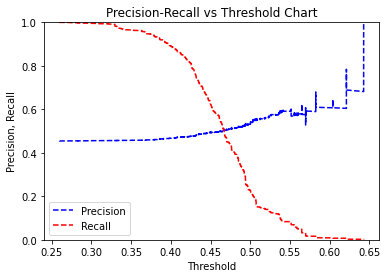

In [46]:
y_probs = model_LRC.predict_proba(x_test_WOE)

from sklearn import metrics
from sklearn.metrics import precision_recall_curve
precision, recall, thresholds = precision_recall_curve(y_test_encoded_df[1], y_probs[:, 
1]) 
   #retrieve probability of being 1(in second column of probs_y)
pr_auc = metrics.auc(recall, precision)

plt.title("Precision-Recall vs Threshold Chart")
plt.plot(thresholds, precision[: -1], "b--", label="Precision")
plt.plot(thresholds, recall[: -1], "r--", label="Recall")
plt.ylabel("Precision, Recall")
plt.xlabel("Threshold")
plt.legend(loc="lower left")
plt.ylim([0,1])

In [55]:
y_probs = np.array(model_LRC.predict_proba(x_test_WOE))
threshold_range = np.arange(0.1, 1, 0.1)
print('Threshold \t Accuracy')
for threshold in threshold_range:
    y_preds = y_probs // threshold
    print('\t', np.sum(y_preds[:][1]))
    summ = 0
    for i in range(len(y_test_encoded_df[1])):
        if y_preds[i][1] == y_test_encoded_df[1][i]:
            summ += 1
    print(threshold,'\t\t', summ/len(y_test_encoded_df[1]))

Threshold 	 Accuracy
	 9.0
0.1 		 0.0
	 4.0
0.2 		 0.04868339207961849
	 2.0
0.30000000000000004 		 0.4537839518971594
	 2.0
0.4 		 0.48774621604810287
	 1.0
0.5 		 0.5579100145137881
	 0.0
0.6 		 0.5470868753887622
	 0.0
0.7000000000000001 		 0.5455940286128965
	 0.0
0.8 		 0.5455940286128965
	 0.0
0.9 		 0.5455940286128965


#### K-NN Classifier

In [74]:
np.random.seed(42)

k = 119

model_KNN = KNeighborsClassifier(n_neighbors=k)
model_KNN.fit(x_RF_imp_train, y_train_encoded_df[1])

model_KNN.score(x_RF_imp_test, y_test_encoded_df[1])

0.8143064482687125

In [ ]:
np.random.seed(42)

error_rate = []

for i in range(1,50,2):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(x_train_WOE, y_train_encoded_df[1])
    error_rate.append(knn.score(x_test_WOE, y_test_encoded_df[1]))
    print(i, 'done')

In [ ]:
for i in range(51,100,2):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(x_train_WOE, y_train_encoded_df[1])
    error_rate.append(knn.score(x_test_WOE, y_test_encoded_df[1]))
    print(i, 'done')

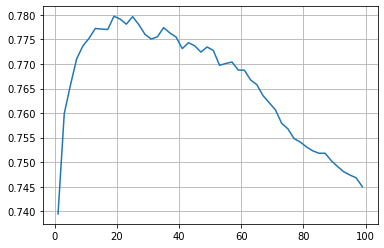

In [ ]:
plt.plot(range(1,100,2), error_rate)
plt.grid()

100 done
120 done
140 done
160 done
180 done
200 done
220 done
240 done
260 done
280 done


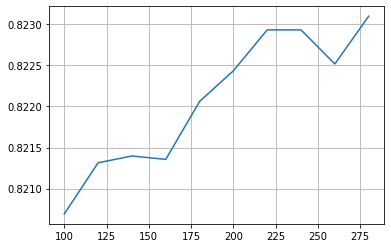

In [ ]:
np.random.seed(42)

rf_acc = []

for i in range(100, 300, 20):
  rf = RandomForestClassifier(n_estimators=i)
  rf.fit(x_RF_imp_train, y_train_encoded_df[1])
  rf_acc.append(rf.score(x_test_WOE, y_test_encoded_df[1]))
  print(i, 'done')

plt.plot(range(100, 300, 20), rf_acc)
plt.grid()

In [ ]:
np.random.seed(42)

# rf_acc = []

for i in range(400, 600, 20):
  rf = RandomForestClassifier(n_estimators=i)

  rf.fit(x_RF_imp_train, y_train_encoded_df[1])

  rf_acc.append(rf.score(x_RF_imp_test, y_test_encoded_df[1]))

  print(i, 'done', rf_acc[-1])

400 done 0.8167530582624922
420 done 0.8181629691063653
440 done 0.8178312253783951
460 done 0.8176238855484138
480 done 0.8176238855484138
500 done 0.8180385652083765
520 done 0.8174994816504251
540 done 0.8174994816504251
560 done 0.8180800331743728
580 done 0.8177068214804064


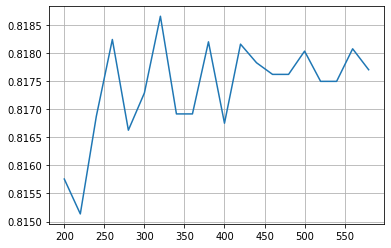

In [ ]:
plt.plot(range(200, 600, 20), rf_acc)
plt.grid()